<a href="https://colab.research.google.com/github/luiz-felipe-moreira/car-damage-segmentation/blob/main/512x512_ResNet101.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Instance Segmentation de Danos em Automóveis usando TF Model Garden


Este notebook faz o treinamento (fine-tuning) de uma [Mask R-CNN](https://arxiv.org/abs/1703.06870) implementada no [pacote TensorFlow Model Garden](https://pypi.org/project/tf-models-official/) (tensorflow-models). O backbone utilizado (checkpoint) também foi obtido do [Model Garden](https://www.tensorflow.org/tfmodels).  
  
Descrição do Model Garden:  
"[Model Garden](https://www.tensorflow.org/tfmodels) contains a collection of state-of-the-art models, implemented with TensorFlow's high-level APIs. The implementations demonstrate the best practices for modeling, letting users to take full advantage of TensorFlow for their research and product development."

##Verifica se estamos usando GPU e qual sua configuração

In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Mon Jan 29 20:27:10 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla V100-SXM2-16GB           Off | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P0              22W / 300W |      0MiB / 16384MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('A instância tem {:.1f} gigabytes de RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Não está usando uma instância de RAM alta')
else:
  print('Usando uma instância de RAM alta!')

A instância tem 54.8 gigabytes de RAM

Usando uma instância de RAM alta!


## Instala as dependências

In [ ]:
!python --version

Python 3.10.12


In [ ]:
!pip install tensorflow==2.15.0

In [ ]:
!pip install -q "tf-models-official"
!pip install -U -q remotezip tqdm opencv-python einops

## Importa as bibliotecas

In [ ]:
import os
import io
import json
import tqdm
import shutil
import pprint
import pathlib
import tempfile
import requests
import collections
import matplotlib
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

from PIL import Image
from six import BytesIO
from etils import epath
from IPython import display
from urllib.request import urlopen

In [ ]:
import orbit
import tensorflow as tf
import tensorflow_models as tfm
import tensorflow_datasets as tfds

from official.core import exp_factory, base_trainer
from official.core import config_definitions as cfg
from official.vision.data import tfrecord_lib
from official.vision.serving import export_saved_model_lib
from official.vision.dataloaders.tf_example_decoder import TfExampleDecoder
from official.vision.utils.object_detection import visualization_utils
from official.vision.ops.preprocess_ops import normalize_image, resize_and_crop_image
from official.vision.data.create_coco_tf_record import coco_annotations_to_lists

pp = pprint.PrettyPrinter(indent=4) # Set Pretty Print Indentation
print(tf.__version__) # Check the version of tensorflow used

%matplotlib inline

2.14.1


## Download das anotações do dataset
Faz download das anotações do Google Cloud Storage para a máquina usada pelo Colab.

In [ ]:
# @title Download JSONs de anotação

!gsutil cp gs://car-damage-recognition/instances_train2017.json .
!gsutil cp gs://car-damage-recognition/instances_val2017.json .
!gsutil cp gs://car-damage-recognition/instances_test2017.json .

Copying gs://car-damage-recognition/instances_train2017.json...
/ [1 files][ 19.6 MiB/ 19.6 MiB]                                                
Operation completed over 1 objects/19.6 MiB.                                     
Copying gs://car-damage-recognition/instances_val2017.json...
/ [1 files][  5.7 MiB/  5.7 MiB]                                                
Operation completed over 1 objects/5.7 MiB.                                      
Copying gs://car-damage-recognition/instances_test2017.json...
/ [1 files][  2.5 MiB/  2.5 MiB]                                                
Operation completed over 1 objects/2.5 MiB.                                      


In [ ]:
# @title Funções para parsing das anotações do dataset CarDD

def get_category_map(annotation_path, num_classes):
  with epath.Path(annotation_path).open() as f:
      data = json.load(f)

  category_map = {id+1: {'id': cat_dict['id'],
                       'name': cat_dict['name']}
                  for id, cat_dict in enumerate(data['categories'][:num_classes])}
  return category_map

class CarDDAnnotation:
  """CarDD annotation helper class.
  """

  def __init__(self, annotation_path):
    with epath.Path(annotation_path).open() as f:
      data = json.load(f)
    self._data = data

    img_id2annotations = collections.defaultdict(list)
    for a in self._data.get('annotations', []):
      if a['category_id'] in category_ids:
        img_id2annotations[a['image_id']].append(a)
    self._img_id2annotations = {
        k: list(sorted(v, key=lambda a: a['id']))
        for k, v in img_id2annotations.items()
    }

  @property
  def categories(self):
    """Return the category dicts, as sorted in the file."""
    return self._data['categories']

  @property
  def images(self):
    """Return the image dicts, as sorted in the file."""
    sub_images = []
    for image_info in self._data['images']:
      if image_info['id'] in self._img_id2annotations:
        sub_images.append(image_info)
    return sub_images

  def get_annotations(self, img_id):
    """Return all annotations associated with the image id string."""
    # Some images don't have any annotations. Return empty list instead.
    return self._img_id2annotations.get(img_id, [])

In [ ]:
# @title Definição da quantidade de classes do dataset
NUM_CLASSES = 6

In [ ]:
# @title Obtenção das categorias
train_annotation_path = './instances_train2017.json'
valid_annotation_path = './instances_val2017.json'
test_annotation_path = './instances_test2017.json'

category_index = get_category_map(valid_annotation_path, NUM_CLASSES)
category_ids = list(category_index.keys())
category_index

{1: {'id': 1, 'name': 'dent'},
 2: {'id': 2, 'name': 'scratch'},
 3: {'id': 3, 'name': 'crack'},
 4: {'id': 4, 'name': 'glass shatter'},
 5: {'id': 5, 'name': 'lamp broken'},
 6: {'id': 6, 'name': 'tire flat'}}

## Configura o modelo MaskRCNN Resnet FPN para o dataset CarDD

In [ ]:
#para pegar tfrecords do Cloud Storage
train_data_input_path = 'gs://car-damage-recognition/cardd_tfrecords_all_sets/train*'
valid_data_input_path = 'gs://car-damage-recognition/cardd_tfrecords_all_sets/val*'
test_data_input_path = 'gs://car-damage-recognition/cardd_tfrecords_all_sets/test*'

In [ ]:
HEIGHT = 512
WIDTH = 512

No Model Garden, as coleções de parâmetros que definem os modelos são chamadas de *configs*. Model Garden pode criar uma config baseado em um conjunto de parâmetros usando uma [factory](https://en.wikipedia.org/wiki/Factory_method_pattern).


Usamos a  configuração de experimento chamada `maskrcnn_resnetfpn_coco`, definida em `tfm.vision.configs.maskrcnn.maskrcnn_resnetfpn_coco`.

Lista de todos os experimentos registrados: https://www.tensorflow.org/api_docs/python/tfm/core/exp_factory/get_exp_config

The configuration defines an experiment to train a Mask R-CNN model with resnet50 as backbone and FPN as decoder. Default Configuration is trained on [COCO](https://cocodataset.org/) train2017 and evaluated on [COCO](https://cocodataset.org/) val2017.

There are also other alternative experiments available such as
`maskrcnn_mobilenet_coco`,
`maskrcnn_spinenet_coco` and more. One can switch to them by changing the experiment name argument to the `get_exp_config` function.

### Faz o download do arquivo que contém os valores de configuração que serão sobrescritos

In [ ]:
!gsutil cp gs://car-damage-recognition/configs/resnet101-unfrozen-batch8.yml resnet101-unfrozen-batch8.yml

Copying gs://car-damage-recognition/configs/resnet101-unfrozen-batch8.yml...
/ [1 files][  1.5 KiB/  1.5 KiB]                                                
Operation completed over 1 objects/1.5 KiB.                                      


### Ajusta a configuração

Usando como base a configuração para o dataset COCO e altera alguns parâmetros para o dataset CarDD

In [ ]:
exp_config = exp_factory.get_exp_config('maskrcnn_resnetfpn_coco')
import yaml

with open('resnet101-unfrozen-batch8.yml', 'r') as file:
  override_params = yaml.full_load(file)

exp_config.override(override_params, is_strict=False)

Exibe todos os parâmetros de configuração

In [ ]:
pp.pprint(exp_config.as_dict())
display.Javascript("google.colab.output.setIframeHeight('500px');")

{   'runtime': {   'all_reduce_alg': None,
                   'batchnorm_spatial_persistent': False,
                   'dataset_num_private_threads': None,
                   'default_shard_dim': -1,
                   'distribution_strategy': 'mirrored',
                   'enable_xla': True,
                   'gpu_thread_mode': None,
                   'loss_scale': None,
                   'mixed_precision_dtype': 'bfloat16',
                   'num_cores_per_replica': 1,
                   'num_gpus': 0,
                   'num_packs': 1,
                   'per_gpu_thread_count': 0,
                   'run_eagerly': False,
                   'task_index': -1,
                   'tpu': None,
                   'tpu_enable_xla_dynamic_padder': None,
                   'use_tpu_mp_strategy': False,
                   'worker_hosts': None},
    'task': {   'allow_image_summary': False,
                'allowed_mask_class_ids': None,
                'annotation_file': None,
         

<IPython.core.display.Javascript object>

### Define pastas onde o treinamento irá gravar

In [ ]:
nome_experimento = 'experiment2-Resnet101-unfrozen-GPU-V100-high-ram'

In [ ]:
model_dir = 'gs://car-damage-recognition/experiments/' + nome_experimento + '/trained_model/'
export_dir = 'gs://car-damage-recognition/experiments/' + nome_experimento + '/exported_model/'

### Configura a distribution strategy do Tensor Flow

In [ ]:
# @title Para uso de GPU
# COMENTAR SE NÃO FOR USAR GPU

logical_device_names = [logical_device.name for logical_device in tf.config.list_logical_devices()]

# Setting up the Strategy
if exp_config.runtime.mixed_precision_dtype == tf.float16:
    tf.keras.mixed_precision.set_global_policy('mixed_float16')

if 'GPU' in ''.join(logical_device_names):
  distribution_strategy = tf.distribute.MirroredStrategy()
elif 'TPU' in ''.join(logical_device_names):
  tf.tpu.experimental.initialize_tpu_system()
  tpu = tf.distribute.cluster_resolver.TPUClusterResolver(tpu='/device:TPU_SYSTEM:0')
  distribution_strategy = tf.distribute.experimental.TPUStrategy(tpu)
else:
  print('Warning: this will be really slow.')
  distribution_strategy = tf.distribute.OneDeviceStrategy(logical_device_names[0])

print("Done")

logical_device_names

Done


['/device:CPU:0']

In [ ]:
tf.config.list_logical_devices()

[LogicalDevice(name='/device:CPU:0', device_type='CPU')]

## Create the `Task` object (`tfm.core.base_task.Task`) from the `config_definitions.TaskConfig`.

The `Task` object has all the methods necessary for building the dataset, building the model, and running training & evaluation. These methods are driven by `tfm.core.train_lib.run_experiment`.

In [ ]:
with distribution_strategy.scope():
  task = tfm.core.task_factory.get_task(exp_config.task, logging_dir=model_dir)

## Visualize a batch of the data.

In [ ]:
for images, labels in task.build_inputs(exp_config.task.train_data).take(1):
  print()
  print(f'images.shape: {str(images.shape):16}  images.dtype: {images.dtype!r}')
  print(f'labels.keys: {labels.keys()}')

Instructions for updating:
Use fn_output_signature instead



images.shape: (4, 512, 512, 3)  images.dtype: tf.float32
labels.keys: dict_keys(['anchor_boxes', 'image_info', 'rpn_score_targets', 'rpn_box_targets', 'gt_boxes', 'gt_classes', 'gt_outer_boxes', 'gt_masks'])


### Create Category Index Dictionary to map the labels to coressponding label names

In [ ]:
tf_ex_decoder = TfExampleDecoder(include_mask=True)

### Helper Function for Visualizing the results from TFRecords
Use `visualize_boxes_and_labels_on_image_array` from `visualization_utils` to draw boudning boxes on the image.

In [ ]:
def show_batch(raw_records):
  plt.figure(figsize=(20, 20))
  use_normalized_coordinates=True
  min_score_thresh = 0.30
  for i, serialized_example in enumerate(raw_records):
    plt.subplot(1, 3, i + 1)
    decoded_tensors = tf_ex_decoder.decode(serialized_example)
    image = decoded_tensors['image'].numpy().astype('uint8')
    scores = np.ones(shape=(len(decoded_tensors['groundtruth_boxes'])))
    # print(decoded_tensors['groundtruth_instance_masks'].numpy().shape)
    # print(decoded_tensors.keys())
    visualization_utils.visualize_boxes_and_labels_on_image_array(
        image,
        decoded_tensors['groundtruth_boxes'].numpy(),
        decoded_tensors['groundtruth_classes'].numpy().astype('int'),
        scores,
        category_index=category_index,
        use_normalized_coordinates=use_normalized_coordinates,
        min_score_thresh=min_score_thresh,
        instance_masks=decoded_tensors['groundtruth_instance_masks'].numpy().astype('uint8'),
        line_thickness=4)

    plt.imshow(image)
    plt.axis("off")
    plt.title(f"Image-{i+1}")
  plt.show()

### Visualiza dados de treino

A detecção de caixa delimitadora tem três componentes
  1. Rótulo de classe do objeto detectado.
  2. Porcentagem de correspondência entre as bounding boxes preditas e do ground truth.
  3. Máscara de segmentação de instância

**Nota**: A razão de tudo estar 100% porque estamos visualizando o ground truth

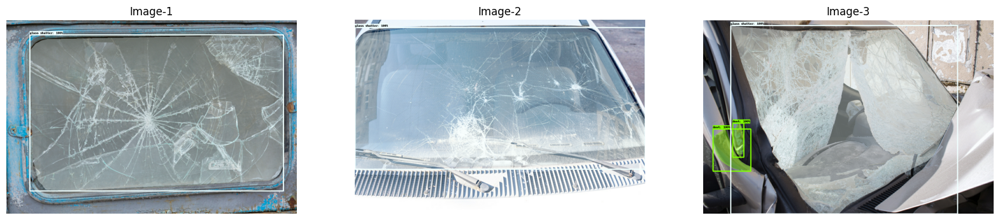

In [ ]:
buffer_size = 20
num_of_examples = 3

train_tfrecords = tf.io.gfile.glob(exp_config.task.train_data.input_path)
raw_records = tf.data.TFRecordDataset(train_tfrecords).shuffle(buffer_size=buffer_size).take(num_of_examples)
show_batch(raw_records)

In [ ]:
raw_records

<_TakeDataset element_spec=TensorSpec(shape=(), dtype=tf.string, name=None)>

## Treinamento, junto com avaliação no conjunto de validação

Seguimos a tradição do desafio COCO para avaliar a precisão da detecção de objetos com base no mAP (mean Average Precision). Verifique [no site do COCO](https://cocodataset.org/#detection-eval) para obter explicações detalhadas sobre como as métricas de avaliação para tarefas de detecção são feitas.

In [ ]:
#se der erro durante o treinamento em TPU, pode ser necessário dar permissão de Object Admin para o usuário da TPU no Cloud Storage
model, eval_logs = tfm.core.train_lib.run_experiment(
    distribution_strategy=distribution_strategy,
    task=task,
    mode='train_and_eval',
    params=exp_config,
    model_dir=model_dir,
    run_post_eval=True)

INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Redu

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
restoring or initializing model...
restored model from gs://car-damage-recognition/experiments/experiment-Resnet101-unfrozen-GPU-V100-high-ram/trained_model/ckpt-31680.
restored from checkpoint: gs://car-damage-recognition/experiments/experiment-Resnet101-unfrozen-GPU-V100-high-ram/trained_model/ckpt-31680
train | step:  31680 | training until step 32384...
train | step:  32384 | steps/sec:    1.9 | output: 
    {'frcnn_box_loss': 0.01123178,
     'frcnn_cls_loss': 0.011768317,
     'learning_rate': 0.002,
     'mask_loss': 0.0731815,
     'model_loss': 0.09922993,
     'rpn_box_loss': 0.0023795022,
     'rpn_score_loss': 0.00066876475,
     'total_loss': 0.43026495,
     'training_loss': 0.43026495}
 eval | step:  32384 | running 202 steps of evaluation...
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=3.52s).
Accumulating evaluation results...
D

## Carrega logs no tensorboard

In [ ]:
# uri_trained_model = 'gs://car-damage-recognition/trained_model_' + nome_experimento
#para trazer o resultado do treinamento do Cloud Storage para a máquina
# !gsutil cp -r gs://car-damage-recognition/trained_model_resnet50-frozen-backend-batch64 '.'
!gsutil cp -r gs://car-damage-recognition/experiments/experiment-Resnet101-unfrozen-GPU-V100-high-ram/trained_model .

Copying gs://car-damage-recognition/experiments/experiment-Resnet101-unfrozen-GPU-V100-high-ram/trained_model/annotation.json...
Copying gs://car-damage-recognition/experiments/experiment-Resnet101-unfrozen-GPU-V100-high-ram/trained_model/checkpoint...
Copying gs://car-damage-recognition/experiments/experiment-Resnet101-unfrozen-GPU-V100-high-ram/trained_model/ckpt-28864.data-00000-of-00001...
==> NOTE: You are downloading one or more large file(s), which would
run significantly faster if you enabled sliced object downloads. This
feature is enabled by default but requires that compiled crcmod be
installed (see "gsutil help crcmod").

| [3 files][497.5 MiB/497.5 MiB]                                                
==> NOTE: You are performing a sequence of gsutil operations that may
run significantly faster if you instead use gsutil -m cp ... Please
see the -m section under "gsutil help options" for further information
about when gsutil -m can be advantageous.

Copying gs://car-damage-r

In [ ]:
#para funcionar, deve-se permitir cookies de terceiros no navegador
#no Firefox, desativar proteção aprimorada contra rastreamento
%load_ext tensorboard
# %reload_ext tensorboard
# dir_trained_model = "./trained_model_" + nome_experimento
# %tensorboard --logdir trained_model_resnet50-frozen-backend-batch64
%tensorboard --logdir trained_model

<IPython.core.display.Javascript object>

## Salva e exporta o modelo treinado

"The `keras.Model` object returned by `train_lib.run_experiment` expects the data to be normalized by the dataset loader using the same mean and variance statiscics in `preprocess_ops.normalize_image(image, offset=MEAN_RGB, scale=STDDEV_RGB)`. This export function handles those details, so you can pass `tf.uint8` images and get the correct results."

In [ ]:
export_dir = 'gs://car-damage-recognition/experiments/' + nome_experimento + '/exported_model_continua_treino/'

In [ ]:
export_saved_model_lib.export_inference_graph(
    input_type='image_tensor',
    batch_size=1,
    input_image_size=[HEIGHT, WIDTH],
    params=exp_config,
    checkpoint_path=tf.train.latest_checkpoint(model_dir),
    export_dir=export_dir)

INFO:tensorflow:Assets written to: gs://car-damage-recognition/experiments/experiment-Resnet101-unfrozen-GPU-V100-high-ram/exported_model_continua_treino/assets


In [ ]:
model_dir

'gs://car-damage-recognition/experiments/experiment-Resnet101-unfrozen-GPU-V100-high-ram/trained_model/'

## Inferência

In [ ]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: the file path to the image

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  image = None
  if(path.startswith('http')):
    response = urlopen(path)
    image_data = response.read()
    image_data = BytesIO(image_data)
    image = Image.open(image_data)
  else:
    image_data = tf.io.gfile.GFile(path, 'rb').read()
    image = Image.open(BytesIO(image_data))

  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (1, im_height, im_width, 3)).astype(np.uint8)



def build_inputs_for_object_detection(image, input_image_size):
  """Builds Object Detection model inputs for serving."""
  image, _ = resize_and_crop_image(
      image,
      input_image_size,
      padded_size=input_image_size,
      aug_scale_min=1.0,
      aug_scale_max=1.0)
  return image

### Importing SavedModel

In [ ]:
export_dir

'gs://car-damage-recognition/experiments/experiment-Resnet101-unfrozen-GPU-V100-high-ram/exported_model/'

In [ ]:
imported = tf.saved_model.load(export_dir)
model_fn = imported.signatures['serving_default']

In [ ]:
pp.pprint(model_fn.pretty_printed_signature())

('signature_wrapper(*, inputs)\n'
 '  Args:\n'
 '    inputs: uint8 Tensor, shape=(1, None, None, 3)\n'
 '  Returns:\n'
 "    {'detection_boxes': <1>, 'detection_classes': <2>, 'detection_masks': "
 "<3>, 'detection_scores': <4>, 'image_info': <5>, 'num_detections': <6>}\n"
 '      <1>: float32 Tensor, shape=(1, 100, 4)\n'
 '      <2>: int32 Tensor, shape=(1, 100)\n'
 '      <3>: float32 Tensor, shape=(1, 100, 28, 28)\n'
 '      <4>: float32 Tensor, shape=(1, 100)\n'
 '      <5>: float32 Tensor, shape=(1, 4, 2)\n'
 '      <6>: int32 Tensor, shape=(1,)')


### Visualizando dados de validação

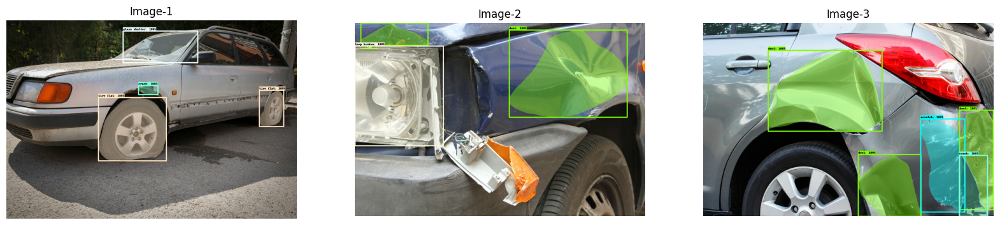

In [ ]:
num_of_examples = 3

test_tfrecords = tf.io.gfile.glob('gs://car-damage-recognition/cardd_tfrecords_all_sets/val*')

test_ds = tf.data.TFRecordDataset(test_tfrecords).take(num_of_examples)
show_batch(test_ds)

### Visualiza predições (IMAGEM DE ENTRADA 512 x 512)

In [ ]:
def reframe_image_corners_relative_to_boxes(boxes):
  """Reframe the image corners ([0, 0, 1, 1]) to be relative to boxes.
  The local coordinate frame of each box is assumed to be relative to
  its own for corners.
  Args:
    boxes: A float tensor of [num_boxes, 4] of (ymin, xmin, ymax, xmax)
      coordinates in relative coordinate space of each bounding box.
  Returns:
    reframed_boxes: Reframes boxes with same shape as input.
  """
  ymin, xmin, ymax, xmax = (boxes[:, 0], boxes[:, 1], boxes[:, 2], boxes[:, 3])

  height = tf.maximum(ymax - ymin, 1e-4)
  width = tf.maximum(xmax - xmin, 1e-4)

  ymin_out = (0 - ymin) / height
  xmin_out = (0 - xmin) / width
  ymax_out = (1 - ymin) / height
  xmax_out = (1 - xmin) / width
  return tf.stack([ymin_out, xmin_out, ymax_out, xmax_out], axis=1)

def reframe_box_masks_to_image_masks(box_masks, boxes, image_height,
                                     image_width, resize_method='bilinear'):
  """Transforms the box masks back to full image masks.
  Embeds masks in bounding boxes of larger masks whose shapes correspond to
  image shape.
  Args:
    box_masks: A tensor of size [num_masks, mask_height, mask_width].
    boxes: A tf.float32 tensor of size [num_masks, 4] containing the box
           corners. Row i contains [ymin, xmin, ymax, xmax] of the box
           corresponding to mask i. Note that the box corners are in
           normalized coordinates.
    image_height: Image height. The output mask will have the same height as
                  the image height.
    image_width: Image width. The output mask will have the same width as the
                 image width.
    resize_method: The resize method, either 'bilinear' or 'nearest'. Note that
      'bilinear' is only respected if box_masks is a float.
  Returns:
    A tensor of size [num_masks, image_height, image_width] with the same dtype
    as `box_masks`.
  """
  resize_method = 'nearest' if box_masks.dtype == tf.uint8 else resize_method

  def reframe_box_masks_to_image_masks_default():
    """The default function when there are more than 0 box masks."""

    num_boxes = tf.shape(box_masks)[0]
    box_masks_expanded = tf.expand_dims(box_masks, axis=3)

    resized_crops = tf.image.crop_and_resize(
        image=box_masks_expanded,
        boxes=reframe_image_corners_relative_to_boxes(boxes),
        box_indices=tf.range(num_boxes),
        crop_size=[image_height, image_width],
        method=resize_method,
        extrapolation_value=0)
    return tf.cast(resized_crops, box_masks.dtype)

  image_masks = tf.cond(
      tf.shape(box_masks)[0] > 0,
      reframe_box_masks_to_image_masks_default,
      lambda: tf.zeros([0, image_height, image_width, 1], box_masks.dtype))
  return tf.squeeze(image_masks, axis=3)

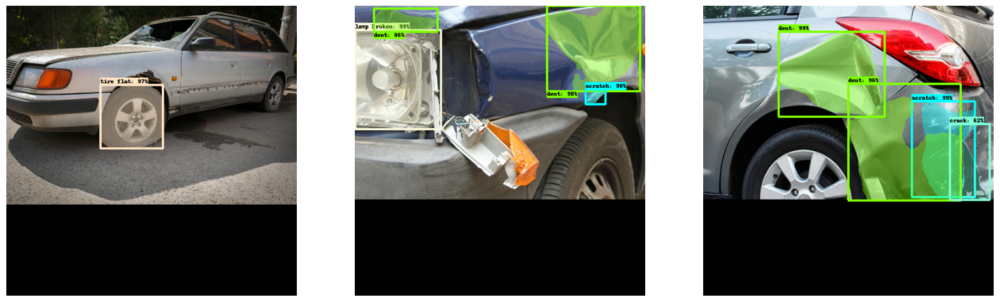

In [ ]:
#IMPORTANTE: COLOCAR NA LINHA 20 A DIMENSÃO DA IMAGEM DE ENTRADA COMO DIVISOR DE detection_boxes
input_image_size = (HEIGHT, WIDTH)
plt.figure(figsize=(20, 20))
min_score_thresh = 0.40

for i, serialized_example in enumerate(test_ds):
  plt.subplot(1, 3, i+1)
  decoded_tensors = tf_ex_decoder.decode(serialized_example)
  image = build_inputs_for_object_detection(decoded_tensors['image'], input_image_size)
  image = tf.expand_dims(image, axis=0)
  image = tf.cast(image, dtype = tf.uint8)
  image_np = image[0].numpy()
  result = model_fn(image)
  # Visualize detection and masks
  if 'detection_masks' in result:
    # we need to convert np.arrays to tensors
    detection_masks = tf.convert_to_tensor(result['detection_masks'][0])
    detection_boxes = tf.convert_to_tensor(result['detection_boxes'][0])
    detection_masks_reframed = reframe_box_masks_to_image_masks(
              detection_masks, detection_boxes/512.0,
                image_np.shape[0], image_np.shape[1])
    detection_masks_reframed = tf.cast(
        detection_masks_reframed > min_score_thresh,
        np.uint8)

    result['detection_masks_reframed'] = detection_masks_reframed.numpy()
  visualization_utils.visualize_boxes_and_labels_on_image_array(
        image_np,
        result['detection_boxes'][0].numpy(),
        (result['detection_classes'][0] + 0).numpy().astype(int),
        result['detection_scores'][0].numpy(),
        category_index=category_index,
        use_normalized_coordinates=False,
        max_boxes_to_draw=200,
        min_score_thresh=min_score_thresh,
        instance_masks=result.get('detection_masks_reframed', None),
        line_thickness=4)

  plt.imshow(image_np)
  plt.axis("off")

plt.show()

## Teste

In [ ]:
exp_config.task.per_category_metrics = True

# Validation Data Config PARA TESTE
exp_config.task.validation_data.input_path = test_data_input_path
exp_config.task.validation_data.dtype = 'float32'
exp_config.task.validation_data.global_batch_size = 1

In [ ]:
quantidade_exemplos_test = 374
# exp_config.trainer.validation_interval = steps_per_epoch
exp_config.trainer.validation_steps =  quantidade_exemplos_test
#exp_config.trainer.validation_steps =  -1 # consome o dataset inteiro

In [ ]:
nome_experimento_teste = 'experiment-Resnet101-unfrozen-GPU-V100-high-ram-test'
model_dir = 'gs://car-damage-recognition/experiments/' + nome_experimento_teste + '/trained_model/'

In [ ]:
with distribution_strategy.scope():
  task = tfm.core.task_factory.get_task(exp_config.task, logging_dir=model_dir)

In [ ]:
model, eval_logs = tfm.core.train_lib.run_experiment(
    distribution_strategy=distribution_strategy,
    task=task,
    mode='eval',
    params=exp_config,
    model_dir=model_dir,
    run_post_eval=True)

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
restoring or initializing model...
restored model from gs://car-damage-recognition/experiments/experiment-Resnet101-unfrozen-GPU-V100-high-ram-test/trained_model/ckpt-31680.
restored from checkpoint: gs://car-damage-recognition/experiments/experiment-Resnet101-unfrozen-GPU-V100-high-ram-test/trained_model/ckpt-31680
 eval | step:  31680 | running 374 steps of evaluation...
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.29s).
Accumulating evaluation results...
DONE (t=0.38s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.444
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.604
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.467
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.141
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium |